In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_masks.npy')

In [3]:
images.shape

(12311, 512, 512, 1)

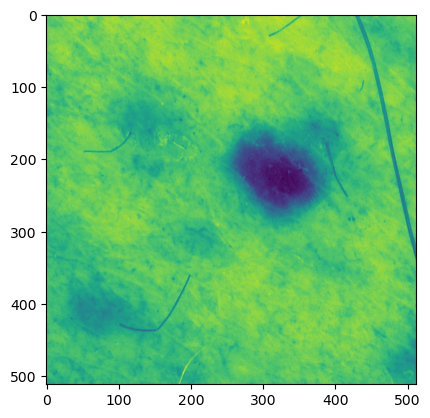

In [4]:
imshow(images[100])

In [5]:
masks.shape

(12311, 512, 512, 1)

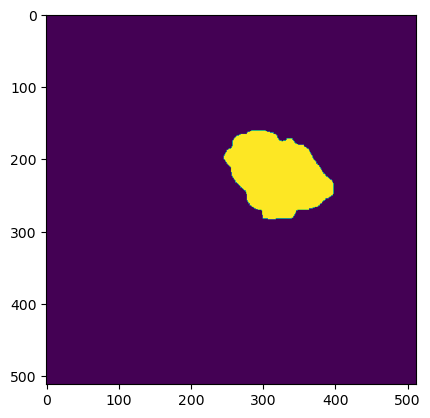

In [6]:
imshow(masks[100])

In [7]:
import sys
sys.path.append('../')
import gp2

In [8]:
from keras import losses

In [9]:
loss_fx = losses.BCE

In [10]:
C = gp2.KUC_UNet2D(loss=loss_fx)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpe25ayq8pkuc_unet2d


In [11]:
weights = {
    'A': 0.5,
    'A_train': 0.1,
    'A_val': 0.3,
    'A_test': 0.6,
    'B': 0.3,
    'B_train': 0.7,
    'B_val': 0.1,
    'B_test': 0.2,
    'Z': 0.2
}
PERCENT_TO_REPLACE = 30

In [12]:
from runner import Runner
R = Runner(verbose=True, workingdir=C.workingdir)

*** GP2 ***
Working directory: /tmp/tmpe25ayq8pkuc_unet2d
Verbose mode active!


In [13]:
R.classifier = C ### use custom classifier

In [14]:
R.setup_data(images, masks, dataset_size=12311, weights=weights)


Weights OK!


In [15]:
RUNS = 3

In [16]:
for run in range(RUNS):
    print('***')
    print('RUN:', run)
    t0 = time.time()
    R.run_classifier(batch_size=16)
    R.run_discriminator()
    l = R.find_machine_labels()
    if l == 0:
        print('No more machine labels.')
        print('TOOK', time.time()-t0, 'seconds')
        break
    R.relabel(percent_to_replace=PERCENT_TO_REPLACE)
    print('TOOK', time.time()-t0, 'seconds')

***
RUN: 0
Epoch 1/100
39/39 [==============================] - 37s 695ms/step - loss: 0.5456 - dice_coeff: 0.3062 - val_loss: 0.5863 - val_dice_coeff: 0.2649
Epoch 2/100
39/39 [==============================] - 19s 483ms/step - loss: 0.4987 - dice_coeff: 0.3422 - val_loss: 0.4927 - val_dice_coeff: 0.3744
Epoch 3/100
39/39 [==============================] - 19s 489ms/step - loss: 0.4522 - dice_coeff: 0.4231 - val_loss: 0.4245 - val_dice_coeff: 0.4848
Epoch 4/100
39/39 [==============================] - 19s 489ms/step - loss: 0.4306 - dice_coeff: 0.4981 - val_loss: 0.4212 - val_dice_coeff: 0.4874
Epoch 5/100
39/39 [==============================] - 19s 489ms/step - loss: 0.4229 - dice_coeff: 0.5171 - val_loss: 0.4035 - val_dice_coeff: 0.5608
Epoch 6/100
39/39 [==============================] - 19s 486ms/step - loss: 0.3927 - dice_coeff: 0.5375 - val_loss: 0.3969 - val_dice_coeff: 0.5948
Epoch 7/100
39/39 [==============================] - 19s 495ms/step - loss: 0.3870 - dice_coeff: 0.56

In [17]:
R.classifier_scores # after 3 runs of GP2

[[0.4056878685951233, 0.5868223905563354],
 [0.43487676978111267, 0.5690478086471558],
 [0.39832931756973267, 0.5658847093582153]]

In [18]:
R.discriminator_scores # after 3 runs of GP2

[[0.00136880564969033, 1.0],
 [0.0030516372062265873, 0.998645007610321],
 [0.008809993974864483, 0.9972899556159973]]

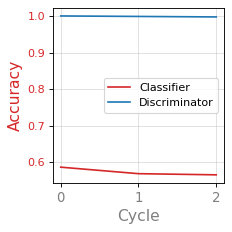

In [19]:
R.plot() # after 3 runs of GP2

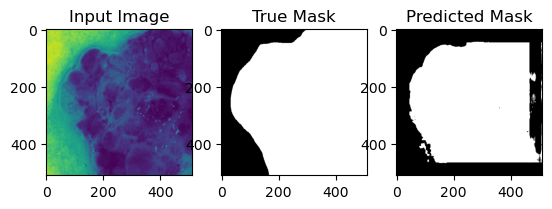

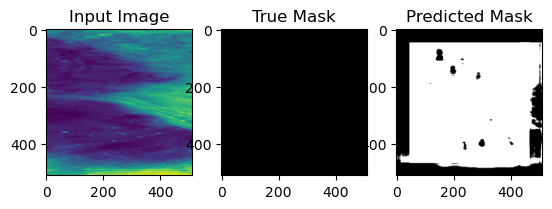

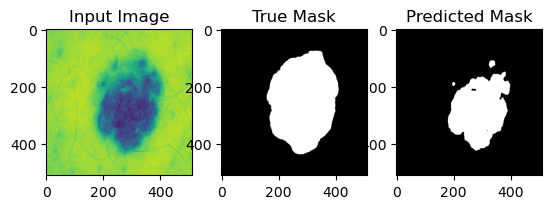

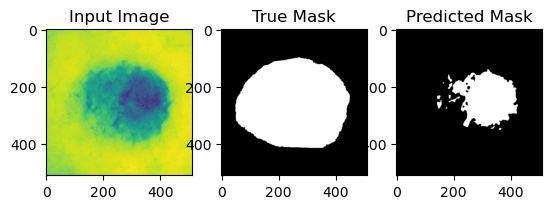

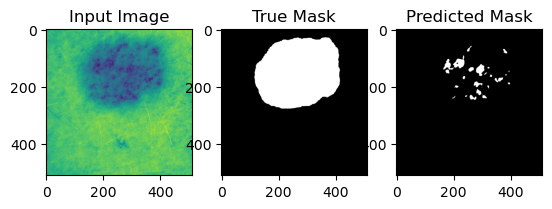

...

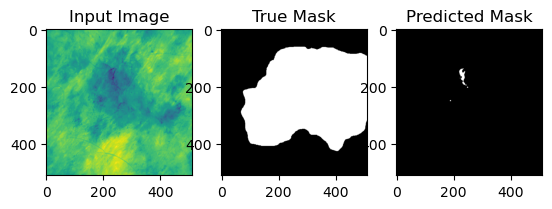

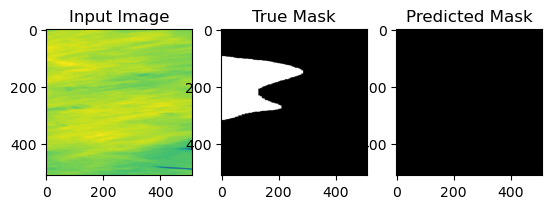

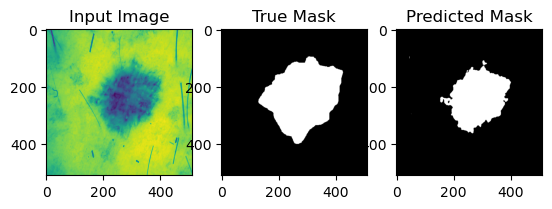

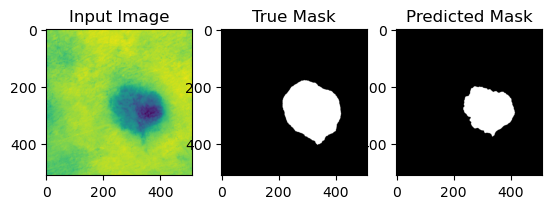

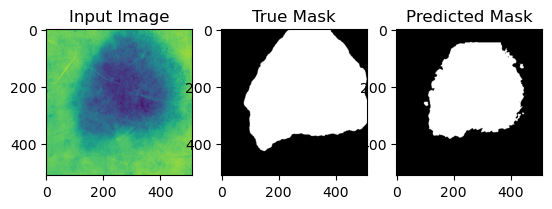

In [20]:
gp2.Util.visualize_predictions(C, images[1000:1500], masks[1000:1500], num_samples=200) # after 3 runs of GP2